In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
else:
    print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
    print('Not using a high-RAM runtime')
else:
    print('You are using a high-RAM runtime!')

Fri Nov 15 16:59:37 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P0             25W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!sudo apt-get install graphviz
!pip install pydot
!pip install visualkeras
!pip install memory-profiler
!pip install tensorflow-addons

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.42.2-3build2).
0 upgraded, 0 newly installed, 0 to remove and 76 not upgraded.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.8/989.8 kB 20.5 MB/s eta 0:00:0000:01


In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import datetime, os, time
import random
import psutil
from PIL import Image
import math
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import visualkeras
from collections import defaultdict
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D, Input, Concatenate, Activation, Add, Multiply, InputLayer, DepthwiseConv2D, Rescaling, SeparableConv2D
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, CSVLogger, ReduceLROnPlateau, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.xception import Xception, preprocess_input
from tensorflow.keras import Model, regularizers, layers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications import VGG19
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

print(tf.__version__)

2.11.0


## Load the Datasets

In [4]:
#loading dataframes
train_df = pd.read_csv('/kaggle/input/rsna-bone-age/boneage-training-dataset.csv')
valid_df = pd.read_csv('/kaggle/input/rsna-boneage-val/Validation Dataset.csv')
test_df = pd.read_csv('/kaggle/input/rsna-bone-age/boneage-test-dataset.csv')

#appending file extension to id column for both training and testing dataframes
train_df['id'] = train_df['id'].apply(lambda x: str(x)+'.png')
valid_df['Image ID'] = valid_df['Image ID'].apply(lambda x: str(x)+'.png')
test_df['Case ID'] = test_df['Case ID'].apply(lambda x: str(x)+'.png') 

#changing column names for make the datasets easy to process
valid_df = valid_df.rename(columns={"Image ID": "id", "Bone Age (months)": "boneage"})
test_df = test_df.rename(columns={"Case ID": "id"})

print("Training Set Values")
print(train_df.head())
print("------------------------------------------")
print("Validation Set Values")
print(valid_df.head())
print("------------------------------------------")
print("Test Set Values")
print(test_df.head())

Training Set Values
         id  boneage   male
0  1377.png      180  False
1  1378.png       12  False
2  1379.png       94  False
3  1380.png      120   True
4  1381.png       82  False
------------------------------------------
Validation Set Values
         id   male  boneage
0  1386.png  False       30
1  1392.png   True      162
2  1397.png  False       18
3  1401.png  False      132
4  1410.png   True       57
------------------------------------------
Test Set Values
         id Sex
0  4360.png   M
1  4361.png   M
2  4362.png   M
3  4363.png   M
4  4364.png   M


**Visualizing datasets**

In [5]:
#finding out the number of male and female children in the dataset
# creating a new column called gender to keep the gender of the child as an integer
train_df['gender'] = train_df['male'].apply(lambda x: 1 if x else 0) # 1 for male and 0 for female
train_df = train_df.drop(columns=['male'])

valid_df['gender'] = valid_df['male'].apply(lambda x: 1 if x else 0) # 1 for male and 0 for female
valid_df = valid_df.drop(columns=['male'])

gender_mapping = {"M": 1, "F": 0}
test_df['gender'] = test_df['Sex'].replace(gender_mapping)
test_df = test_df.drop(columns=['Sex'])

print("Training Set Values")
print(train_df.head())
print("------------------------------------------")
print("Validation Set Values")
print(valid_df.head())
print("------------------------------------------")
print("Test Set Values")
print(test_df.head())

Training Set Values
         id  boneage  gender
0  1377.png      180       0
1  1378.png       12       0
2  1379.png       94       0
3  1380.png      120       1
4  1381.png       82       0
------------------------------------------
Validation Set Values
         id  boneage  gender
0  1386.png       30       0
1  1392.png      162       1
2  1397.png       18       0
3  1401.png      132       0
4  1410.png       57       1
------------------------------------------
Test Set Values
         id  gender
0  4360.png       1
1  4361.png       1
2  4362.png       1
3  4363.png       1
4  4364.png       1


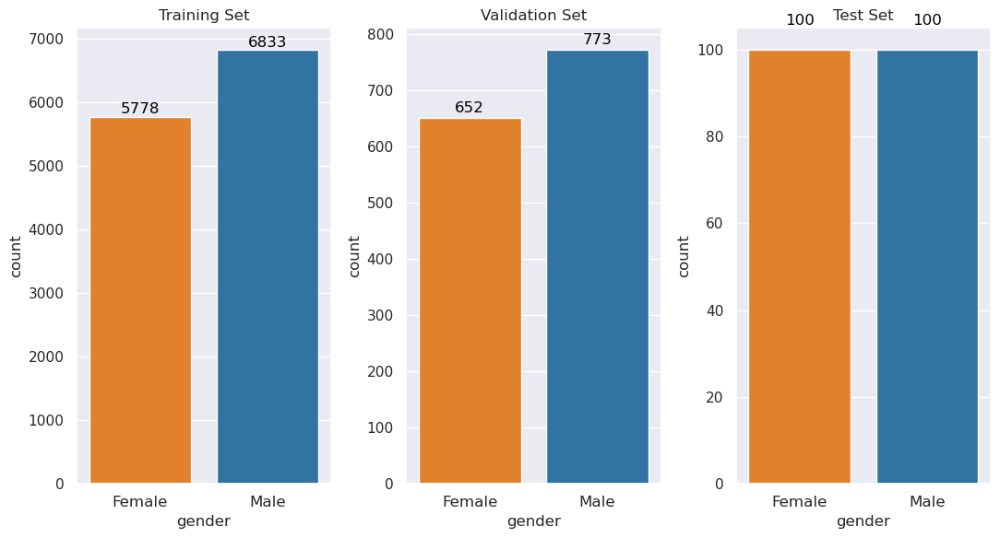

In [6]:
# Set theme and figure size
sns.set_theme(rc={'figure.figsize': (11, 6)})

# Create subplots with three columns
fig, axs = plt.subplots(ncols=3)

# Define colors for male and female
colors = ["#ff7f0e", "#1f77b4"]  # Blue for male, orange for female

# Plot countplot for each dataset with specified colors
sns.countplot(x=train_df['gender'], palette=colors, ax=axs[0])
sns.countplot(x=valid_df['gender'], palette=colors, ax=axs[1])
sns.countplot(x=test_df['gender'], palette=colors, ax=axs[2])

# Set titles and x-axis labels
axs[0].set_title('Training Set')
axs[1].set_title('Validation Set')
axs[2].set_title('Test Set')

# Set custom x-axis labels to display "Male" and "Female"
for ax in axs:
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['Female', 'Male'], fontsize=12)

# Display counts and gender labels on each plot
for ax, dataset in zip(axs, [train_df, valid_df, test_df]):
    total_counts = dataset['gender'].value_counts()
    for gender, count in total_counts.items():
        #label = 'Male' if gender == 0 else 'Female'
        ax.text(gender, count + 5, f"{count}", ha='center', va='bottom', fontsize=12, color='black')

plt.tight_layout()
plt.show()

In [7]:
#oldest child in the dataset
print('MAX age in train set: ' + str(train_df['boneage'].max()) + ' months')
print('MAX age in validation set: ' + str(valid_df['boneage'].max()) + ' months')

#youngest child in the dataset
print('\nMIN age in train set: ' + str(train_df['boneage'].min()) + ' months')
print('MIN age in validation set: ' + str(valid_df['boneage'].min()) + ' months')

#mean age is
mean_bone_age = train_df['boneage'].mean()
print('\nMean of train set: ' + str(mean_bone_age))
mean_bone_age_val = valid_df['boneage'].mean()
print('Mean of validation set: ' + str(mean_bone_age_val))

#median bone age
median_bone_age = train_df['boneage'].median()
print('\nMedian of train set: ' +str(median_bone_age))
median_bone_age_val = valid_df['boneage'].median()
print('Median of validation set: ' +str(median_bone_age_val))

#standard deviation of boneage
std_bone_age = train_df['boneage'].std()
print('\nStd of train set: ' +str(std_bone_age))
std_bone_age_val = valid_df['boneage'].std()
print('Std of validation set: ' +str(std_bone_age_val) +'\n')

#models perform better when features are normalised to have zero mean and unity standard deviation
#using z score for the training
train_df['bone_age_z'] = (train_df['boneage'] - train_df['boneage'].mean())/(train_df['boneage'].std())
valid_df['bone_age_z'] = (valid_df['boneage'] - valid_df['boneage'].mean())/(valid_df['boneage'].std())

print("Training Set Values")
print(train_df.head())
print("------------------------------------------")
print("Validation Set Values")
print(valid_df.head())
print("------------------------------------------")


MAX age in train set: 228 months
MAX age in validation set: 228 months

MIN age in train set: 1 months
MIN age in validation set: 3 months

Mean of train set: 127.3207517246848
Mean of validation set: 127.15649122807018

Median of train set: 132.0
Median of validation set: 132.0

Std of train set: 41.182021399396326
Std of validation set: 41.72201092403196

Training Set Values
         id  boneage  gender  bone_age_z
0  1377.png      180       0    1.279181
1  1378.png       12       0   -2.800269
2  1379.png       94       0   -0.809109
3  1380.png      120       1   -0.177766
4  1381.png       82       0   -1.100498
------------------------------------------
Validation Set Values
         id  boneage  gender  bone_age_z
0  1386.png       30       0   -2.328663
1  1392.png      162       1    0.835135
2  1397.png       18       0   -2.616281
3  1401.png      132       0    0.116090
4  1410.png       57       1   -1.681522
------------------------------------------


Text(0.5, 1.0, 'Number of children in each age group')

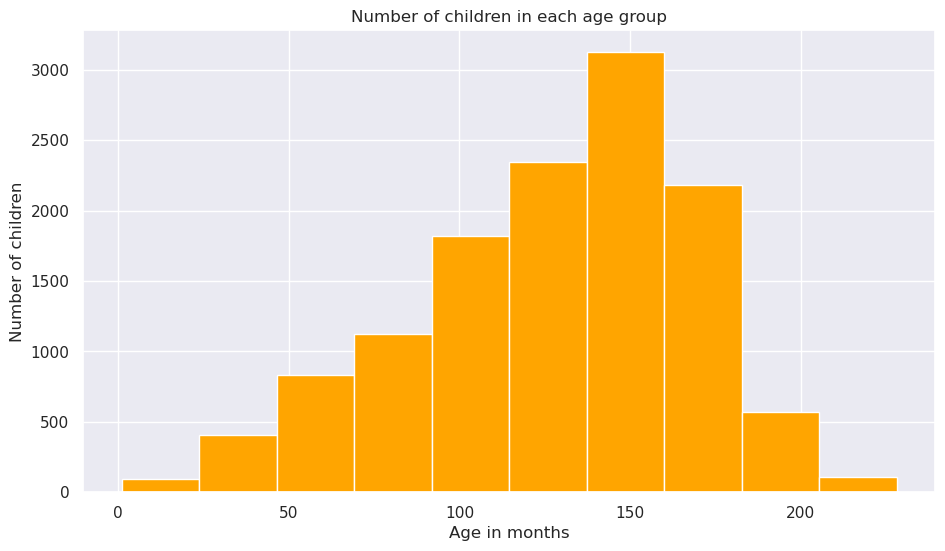

In [8]:
#plotting a histogram for bone ages
train_df['boneage'].hist(color = 'orange')
plt.xlabel('Age in months')
plt.ylabel('Number of children')
plt.title('Number of children in each age group')

Text(0.5, 1.0, 'Relationship between number of children and bone age z score')

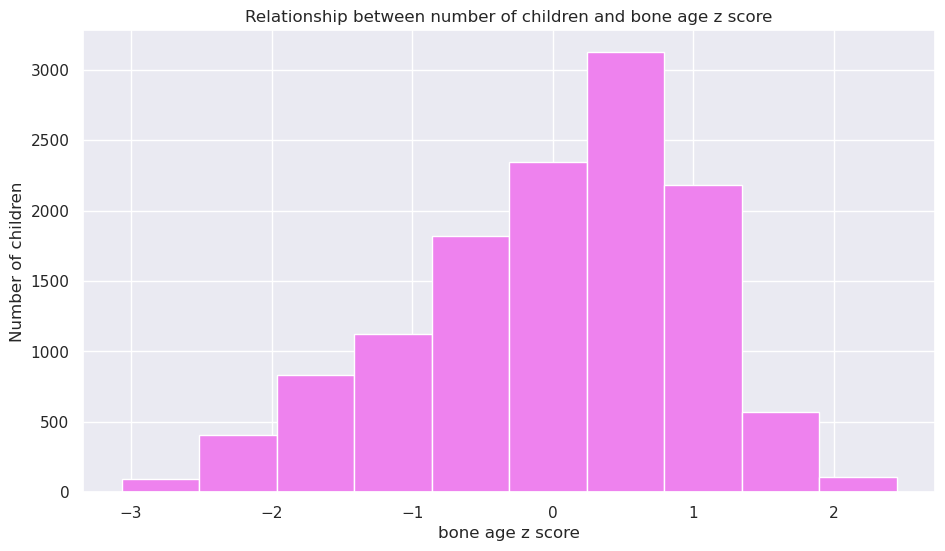

In [9]:
train_df['bone_age_z'].hist(color = 'violet')
plt.xlabel('bone age z score')
plt.ylabel('Number of children')
plt.title('Relationship between number of children and bone age z score')

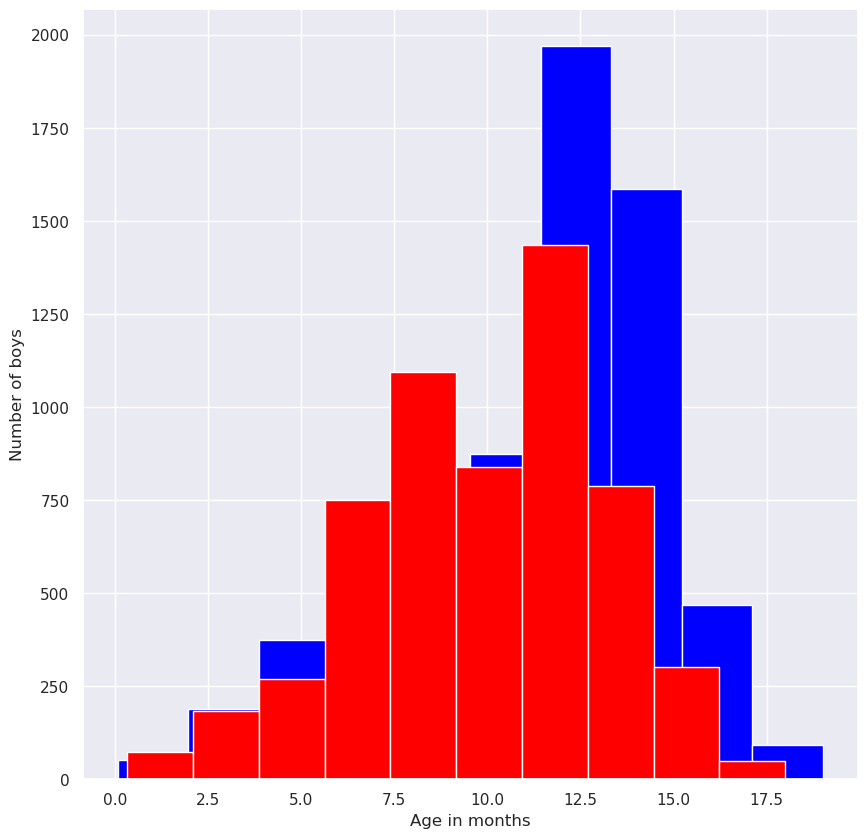

In [10]:
#distribution of age within each gender 
male = train_df[train_df['gender'] == 1]
female = train_df[train_df['gender'] == 0]
fig, ax = plt.subplots(1,1)
ax.hist(male['boneage']/12, color = 'blue')
ax.set_ylabel('Number of boys')
ax.hist(female['boneage']/12, color = 'red')
ax.set_xlabel('Age in months')
fig.set_size_inches((10,10))

In [11]:
df_train = train_df
df_valid = valid_df
df_test = test_df

**Visualize splitting**

Size of df_train: 12611
Size of df_valid: 1425
Size of df_test: 200


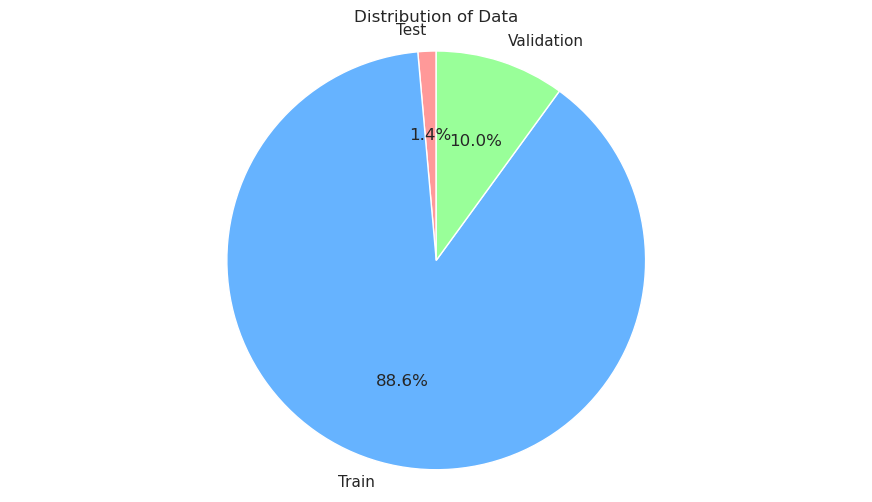

In [12]:
print(f"Size of df_train: {len(df_train)}")
print(f"Size of df_valid: {len(df_valid)}")
print(f"Size of df_test: {len(df_test)}")

sizes = [len(df_test), len(df_train), len(df_valid)]
labels = ['Test', 'Train', 'Validation']
colors = ['#ff9999', '#66b3ff', '#99ff99']

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribution of Data')
plt.show()

In [13]:
from tensorflow.keras.metrics import mean_absolute_error
def mae_in_months(x_p, y_p):
    '''function to return mae in months'''
    return mean_absolute_error((std_bone_age*x_p + mean_bone_age), (std_bone_age*y_p + mean_bone_age))

In [14]:
# To add the sex type into training phase
from sklearn.preprocessing import LabelEncoder

def custom_generator(generator, df, batch_size):

    label_encoder = LabelEncoder()
    df['gender_encoded'] = label_encoder.fit_transform(df['gender'])

    while True:
        batch = next(generator)
        X, y = batch
        try:
            # Approach: index check
            valid_indices = [idx for idx in generator.index_array if idx in df.index]

            if len(valid_indices) == 0:
                print("Valid index not found, proceeding to next batch.")
                continue

            gender = df.loc[valid_indices, 'gender_encoded'].values

            gender = gender.astype(int).reshape(-1, 1)

            # check the dimensions of X and gender and cut if necessary
            min_len = min(len(gender), X.shape[0])
            X = X[:min_len]
            gender = gender[:min_len]
            y = y[:min_len]

            if len(gender) > 0:
                yield [X, gender], y
            else:
                print("Empth batch, proceeding to next batch.")
        except Exception as e:
            print(f"Error in Batch: {e}")
            continue

In [15]:
gender_test = df_valid['gender'].values[:1000]

# Reshape gender data
gender_test = gender_test.reshape(-1, 1)

## **InceptionV3 (2017 RSNA Challange winner model)**

In [ ]:
"""
## Hyperparameters
"""

learning_rate = 1e-4
weight_decay = 1e-5
batch_size = 16
num_epochs = 50
image_size = 500  # Sample image size

In [ ]:
#library required for image preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from  keras.applications.xception import preprocess_input

"""
## Data Preparation
"""

data_augmentation = dict(rotation_range=0.2, zoom_range=0.1, horizontal_flip=True,
                                width_shift_range=0.05,
                                height_shift_range=0.05,
                                shear_range=0.05, fill_mode='nearest')


train_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input, **data_augmentation)
val_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
test_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

#train_data_generator = ImageDataGenerator(rescale=1./255)
#val_data_generator = ImageDataGenerator(rescale=1./255)
#test_data_generator = ImageDataGenerator(rescale=1./255)

train_generator = train_data_generator.flow_from_dataframe(
    dataframe=df_train,
    directory='/kaggle/input/rsna-bone-age/boneage-training-dataset/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='raw',
    flip_horizontal=True,
    color_mode='rgb',
    target_size=(image_size, image_size))

val_generator = val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='raw',
    flip_horizontal=True,
    color_mode='rgb',
    target_size=(image_size, image_size))

test_generator = test_data_generator.flow_from_dataframe(
    dataframe=df_test,
    directory='/kaggle/input/rsna-bone-age/boneage-test-dataset/boneage-test-dataset',
    x_col='id',
    y_col='gender',
    batch_size=batch_size,
    seed=42, 
    shuffle=True,
    class_mode=None,
    color_mode='rgb',
    target_size=(image_size, image_size))

In [ ]:
test_X, test_Y = next(val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=1000,
    class_mode='raw',
    target_size=(image_size, image_size)))

In [ ]:
incv3_m1 = InceptionV3(weights='imagenet', include_top=False, 
                       input_shape=(image_size, image_size, 3), pooling='average')

for layer in incv3_m1.layers:
    layer.trainable = True

x = incv3_m1.output
x = GlobalAveragePooling2D()(x)
#x = Dense(1024, activation='relu')(x)
#x = Dense(512, activation='relu')(x)
#x = Flatten()(x)
#x = Dropout(0.5)(x)

gender_input = Input(shape=(1,), name='gender_input')
gender_densed = Dense(32, activation='relu')(gender_input)
x = Concatenate()([x, gender_densed])

x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)

output = Dense(1, activation='linear', name='age')(x)

incv3_model_7 = Model(inputs=[incv3_m1.input, gender_input], outputs=output)
#model6 = Model(inputs=model_1.input, outputs=output)

In [ ]:
#reduces learning rate if no significant decrease in loss for {{patience}} epochs.
RLROP = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae_in_months', patience=3, verbose=1, factor=0.1, min_lr=1e-6)

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_mae_in_months',
    patience=9,
    restore_best_weights=True
)

optimizer = Adam(
    learning_rate = learning_rate, 
    #weight_decay = weight_decay
)

incv3_model_7.compile(optimizer=optimizer, 
                loss='mse', 
                metrics=[mae_in_months])

checkpoint_filepath = "/tmp/checkpoint.keras"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor='mae_in_months',
        save_best_only=True,
        save_weights_only=False,
)

In [ ]:
train_steps = len(df_train) // batch_size
val_steps = len(df_valid) // batch_size

history_incv3_7 = incv3_model_7.fit(
    custom_generator(train_generator, df_train, batch_size),
    steps_per_epoch=train_steps,
    epochs=num_epochs,
    validation_data=custom_generator(val_generator, df_valid, batch_size),
    validation_steps=val_steps,
    verbose=1, 
    callbacks=[checkpoint_callback, RLROP, early_stop]
)

In [ ]:
metrics = pd.DataFrame(history_incv3_7.history)
metrics.plot()

In [ ]:
# Create a figure with 1 row and 2 columns (2 subplots)
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: MAE in months (Training and Validation)
metrics[['mae_in_months', 'val_mae_in_months']].plot(ax=axs[0])
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('MAE in Months')
axs[0].set_title('Training and Validation MAE in Months')

# Plot 2: Loss (Training and Validation)
metrics[['loss', 'val_loss']].plot(ax=axs[1])
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training and Validation Loss')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the combined plots
plt.show()

In [ ]:
# Create a figure with 2 rows and 2 columns (4 subplots in total)
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Loss
axs[0, 0].plot(metrics.index + 1, metrics['loss'], label='Loss')
axs[0, 0].set_title('Training Loss')
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Loss')

# Plot 2: MAE in months
axs[0, 1].plot(metrics.index + 1, metrics['mae_in_months'], label='MAE in Months', color='g')
axs[0, 1].set_title('Training MAE (in months)')
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('MAE in Months')

# Plot 3: Validation Loss
axs[1, 0].plot(metrics.index + 1, metrics['val_loss'], label='Validation Loss', color='r')
axs[1, 0].set_title('Validation Loss')
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Validation Loss')

# Plot 4: Validation MAE in months
axs[1, 1].plot(metrics.index + 1, metrics['val_mae_in_months'], label='Validation MAE in Months', color='b')
axs[1, 1].set_title('Validation MAE (in months)')
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Validation MAE in Months')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the combined plots
plt.show()

In [ ]:
pred = mean_bone_age + std_bone_age*(incv3_model_7.predict([test_X, gender_test], batch_size = batch_size, verbose = True))
test_months = mean_bone_age + std_bone_age * (test_Y)

In [ ]:
fig, ax = plt.subplots(figsize = (7,7))
ax.plot(test_months, pred, 'r.', label = 'predictions')
ax.plot(test_months, test_months, 'b-', label = 'actual')
ax.legend(loc = 'upper right')
ax.set_xlabel('Actual Age (Months)')
ax.set_ylabel('Predicted Age (Months)')

In [ ]:
e=[]
for i in range(len(pred)):
    e.append(abs(pred[i]-test_months[i]))
    
d={"predicted":[i for i in pred],"original":[j for j in test_months],"error":e}
df=pd.DataFrame(d)
df

In [ ]:
try:
    test_predictions = incv3_model_7.predict([test_X, gender_test])
    print("Prediction successful")
    print("Predictions shape:", test_predictions.shape)
except Exception as e:
    print("Error during prediction:", str(e))

In [ ]:
test_generator.reset()
y_pred = incv3_model_7.predict_generator([test_X, gender_test])
predicted = y_pred.flatten()
predicted_months = mean_bone_age + std_bone_age*(predicted)
filenames=test_generator.filenames


In [ ]:
s=0
for i in range(len(e)):
    s+=e[i]
mae=s/len(e)
print(mae)
print(max(e))
print(min(e))

In [ ]:
try:
    test_loss, test_mae = incv3_model_7.evaluate([test_X, gender_test], test_Y)
    print(f"Test Loss: {round(test_loss, 4)}")
    print(f"Test MAE: {round(test_mae, 2)} months")
except Exception as e:
    print("Error during evaluation:", str(e))

In [ ]:
ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 12).astype(int)] # take 12 evenly spaced ones
fig, axs = plt.subplots(6, 2, figsize = (15, 45))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fY' % (test_months[ind]/12.0, 
                                                           pred[ind]/12.0))
    ax.axis('off')
fig.savefig('/kaggle/working/trained_image_predictions.png', dpi = 300)

In [ ]:
# Clip predictions to ensure they're not negative
pred_clipped = np.clip(pred, 0, None)

print("Clipped predicted ages range (months):", pred_clipped.min(), "to", pred_clipped.max())
print("Actual ages range (months):", test_months.min(), "to", test_months.max())

# Calculate Mean Absolute Error with clipped predictions
mae_months_clipped = np.mean(np.abs(pred_clipped - test_months))
mae_years_clipped = mae_months_clipped / 12

print(f"Mean Absolute Error (after clipping): {mae_months_clipped:.2f} months ({mae_years_clipped:.2f} years)")

# Sort the indices based on actual ages
ord_ind = np.argsort(test_months)

# Select 12 evenly spaced samples
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 12).astype(int)]

"""
# Create the plot
fig, axs = plt.subplots(6, 2, figsize=(15, 45))

for (ind, ax) in zip(ord_ind, axs.flatten()):
    # Display the image
    ax.imshow(test_X[ind, :,:,0], cmap='bone')
    
    # Set the title with actual and predicted ages
    ax.set_title(f'Age: {test_months[ind]/12:.2f}Y\nPredicted Age: {pred_clipped[ind]/12:.2f}Y')
    ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

"""

# Scatter plot of actual vs predicted ages
plt.figure(figsize=(10, 10))
plt.scatter(test_months/12, pred_clipped/12, alpha=0.5)
plt.plot([0, 19], [0, 19], 'r--')  # diagonal line
plt.xlabel('Actual Age (years)')
plt.ylabel('Predicted Age (years)')
plt.title('Actual vs Predicted Bone Age')
plt.show()

# Histogram of errors
errors = pred_clipped - test_months
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50)
plt.xlabel('Error (months)')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Errors')
plt.show()

## Model 1: ConvMixer 

In [35]:
"""
## Hyperparameters
"""

learning_rate = 1e-3
weight_decay = 1e-5
batch_size = 8
num_epochs = 50
image_size = 256  # Sample image size

In [36]:
#library required for image preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from  keras.applications.xception import preprocess_input
import cv2

"""
## Data Preparation
"""
def clahe(image):
    """
    Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) to an image.

    Args:
        image: The input image as a NumPy array.

    Returns:
        The CLAHE-enhanced image as a 3-channel NumPy array.
    """
    # Convert the RGB image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Ensure the image is of type uint8
    gray_image = gray_image.astype('uint8')
    
    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(gray_image)
    
    # Convert the single-channel image back to 3-channel
    clahe_image_rgb = cv2.cvtColor(clahe_image, cv2.COLOR_GRAY2RGB)
    
    return clahe_image_rgb


data_augmentation = dict(rotation_range=0.2, zoom_range=0.1, horizontal_flip=True,
                                width_shift_range=0.05,
                                height_shift_range=0.05,
                                shear_range=0.05, fill_mode='nearest')

# Veri setini uygun şekilde yükle ve hazırla
train_data_generator = ImageDataGenerator(preprocessing_function=clahe, **data_augmentation)
val_data_generator = ImageDataGenerator(preprocessing_function=clahe)
test_data_generator = ImageDataGenerator(preprocessing_function=clahe)

train_generator = train_data_generator.flow_from_dataframe(
    dataframe=df_train,
    directory='/kaggle/input/rsna-bone-age/boneage-training-dataset/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='other',
    color_mode='rgb',
    target_size=(image_size, image_size))

val_generator = val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='other',
    color_mode='rgb',
    target_size=(image_size, image_size))

test_generator = test_data_generator.flow_from_dataframe(
    dataframe=df_test,
    directory='/kaggle/input/rsna-bone-age/boneage-test-dataset/boneage-test-dataset',
    x_col='id',
    y_col='gender',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode=None,
    color_mode='rgb',
    target_size=(image_size, image_size))

Found 12611 validated image filenames.
Found 1425 validated image filenames.
Found 200 validated image filenames.


In [37]:
test_X, test_Y = next(val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=1000,
    class_mode='raw',
    target_size=(image_size, image_size)))

Found 1425 validated image filenames.


**ConvMixer Utilities**

In [38]:
def activation_block(x):
    x = layers.Activation("gelu")(x)
    return layers.BatchNormalization()(x)

def conv_stem(x, filters: int, patch_size: int):
    x = layers.Conv2D(filters, kernel_size=patch_size, strides=patch_size)(x)
    return activation_block(x)

def conv_mixer_block(x, filters: int, kernel_size: int):
    # Depthwise convolution.
    x0 = x
    x = layers.DepthwiseConv2D(kernel_size=kernel_size, padding="same")(x)
    x = layers.Add()([activation_block(x), x0])  # Residual.

    # Pointwise convolution.
    x = layers.Conv2D(filters, kernel_size=1)(x)
    x = activation_block(x)

    return x

def get_conv_mixer_256_8(
    image_size=image_size, filters=256, depth=8, kernel_size=5, patch_size=2, num_classes=1
):
    """
    ConvMixer-256/8: https://openreview.net/pdf?id=TVHS5Y4dNvM.
    The hyperparameter values are taken from the paper.
    """
    inputs = keras.Input((image_size, image_size, 3))
    x = layers.Rescaling(scale=1.0 / 255)(inputs)

    # Extract patch embeddings.
    x = conv_stem(x, filters, patch_size)

    # ConvMixer blocks.
    for _ in range(depth):
        x = conv_mixer_block(x, filters, kernel_size)

    # Regression block.
    x = layers.GlobalAvgPool2D()(x)

    #x = Dense(1024, activation='relu')(x)
    #x = Dense(512, activation='relu')(x)
    #x = Flatten()(x)
    #x = Dropout(0.5)(x)
    
    gender_input = Input(shape=(1,), name='gender_input')
    gender_densed = Dense(32, activation='relu')(gender_input)
    x = Concatenate()([x, gender_densed])

    x = Dense(1024, activation='relu')(x)
    x = Dense(1024, activation='relu')(x)
    
    outputs = layers.Dense(num_classes, activation="linear", name="age")(x)
    
    model_1 = Model(inputs=[inputs, gender_input], outputs=outputs)

    return model_1

**Model training and evaluation utility**

In [39]:
train_steps = len(df_train) // batch_size
val_steps = len(df_valid) // batch_size

conv_mixer_model_1 = get_conv_mixer_256_8(image_size=image_size)

optimizer = AdamW(
    learning_rate=learning_rate, 
    weight_decay=weight_decay
)

conv_mixer_model_1.compile(
    optimizer=optimizer,
    loss = 'mse', 
    metrics = [mae_in_months]
)
   
RLROP = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_mae_in_months', 
    patience=3, 
    verbose=1, 
    factor=0.1, 
    min_lr=1e-5
)

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_mae_in_months',
    patience=7,
    restore_best_weights=True
)

checkpoint_filepath = "/tmp/checkpoint.keras"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor='mae_in_months',
    save_best_only=True,
    save_weights_only=False,
)

conv_mixer_model_1.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 256, 256, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv2d_22 (Conv2D)             (None, 128, 128, 25  3328        ['rescaling_2[0][0]']            
                                6)                                                                
                                                                                            

**Visualize Model**

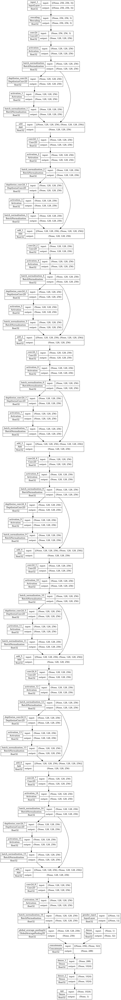

In [21]:
plot_model(
    conv_mixer_model_1,
    to_file='convmixer_model_structure.png',  # Save as a .png file
    show_shapes=True,               # Display output shapes for each layer
    show_dtype=True,                # Display data types of tensors
    show_layer_names=True,          # Display layer names
    expand_nested=False,             # Expand nested models
    dpi=96                          # Set the resolution
)

/opt/conda/lib/python3.7/site-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


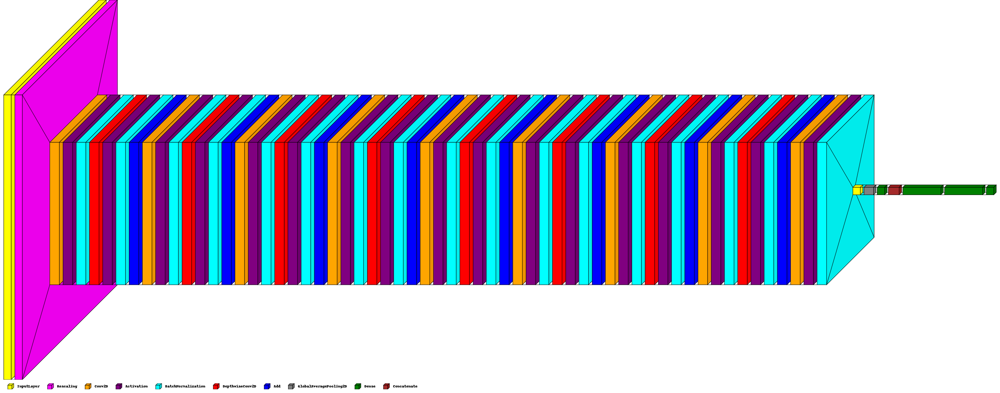

In [22]:
color_map = defaultdict(dict)

color_map[InputLayer]['fill'] = 'yellow'
color_map[Rescaling]['fill'] = 'magenta'
color_map[Conv2D]['fill'] = 'orange'
color_map[Activation]['fill'] = 'purple'
color_map[BatchNormalization]['fill'] = 'cyan'
color_map[DepthwiseConv2D]['fill'] = 'red'
color_map[Add]['fill'] = 'blue'
color_map[GlobalAveragePooling2D]['fill'] = 'gray'
color_map[Dense]['fill'] = 'green'
color_map[Concatenate]['fill'] = 'brown'

visualkeras.layered_view(conv_mixer_model_1, draw_volume=True, legend=True, color_map=color_map, scale_xy=3)

**Train and evaluate model**

In [40]:
start_time = time.time()

history_mix_1 = conv_mixer_model_1.fit(
    custom_generator(train_generator, df_train, batch_size),
    steps_per_epoch=train_steps,
    epochs=num_epochs,
    validation_data=custom_generator(val_generator, df_valid, batch_size),
    validation_steps=val_steps,
    verbose=1, 
    callbacks=[checkpoint_callback, RLROP, early_stop]
)

end_time = time.time()
training_time = end_time - start_time

Epoch 1/50
1576/1576 [==============================] - 927s 585ms/step - loss: 0.7639 - mae_in_months: 28.4341 - val_loss: 0.5148 - val_mae_in_months: 23.0287 - lr: 0.0010
Epoch 2/50
1576/1576 [==============================] - 853s 541ms/step - loss: 0.3566 - mae_in_months: 19.1303 - val_loss: 0.6823 - val_mae_in_months: 27.5059 - lr: 0.0010
Epoch 3/50
1576/1576 [==============================] - 855s 542ms/step - loss: 0.2469 - mae_in_months: 16.1825 - val_loss: 0.1890 - val_mae_in_months: 14.0412 - lr: 0.0010
Epoch 4/50
1576/1576 [==============================] - 854s 542ms/step - loss: 0.2284 - mae_in_months: 15.4760 - val_loss: 0.2519 - val_mae_in_months: 16.5623 - lr: 0.0010
Epoch 5/50
1576/1576 [==============================] - 855s 542ms/step - loss: 0.2061 - mae_in_months: 14.7022 - val_loss: 0.2006 - val_mae_in_months: 14.6783 - lr: 0.0010
Epoch 6/50
1576/1576 [==============================] - 854s 542ms/step - loss: 0.1883 - mae_in_months: 14.0545 - val_loss: 0.1768 - va

In [41]:
print(f"Training time: {training_time:.2f} seconds / {training_time/60:.2f} minutes.")

Training time: 25724.85 seconds / 428.75 minutes.


<AxesSubplot:>

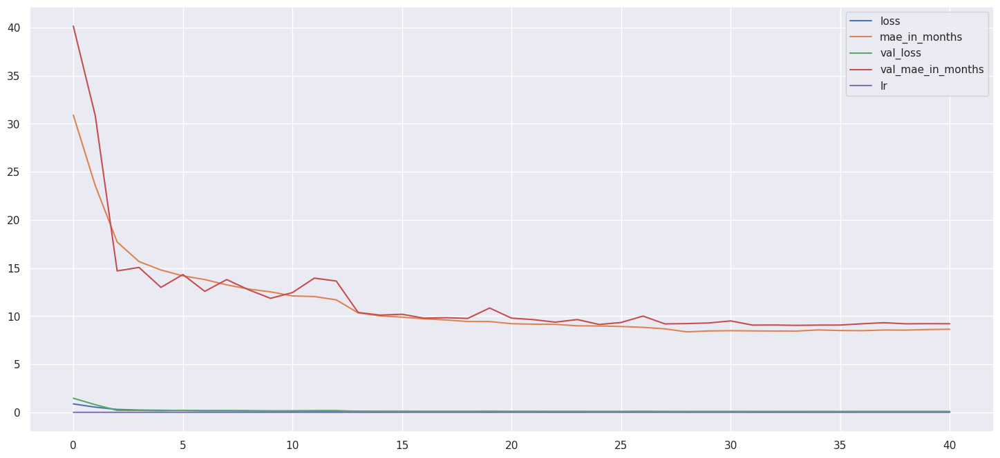

In [21]:
metrics = pd.DataFrame(history_mix_1.history)
metrics.plot()

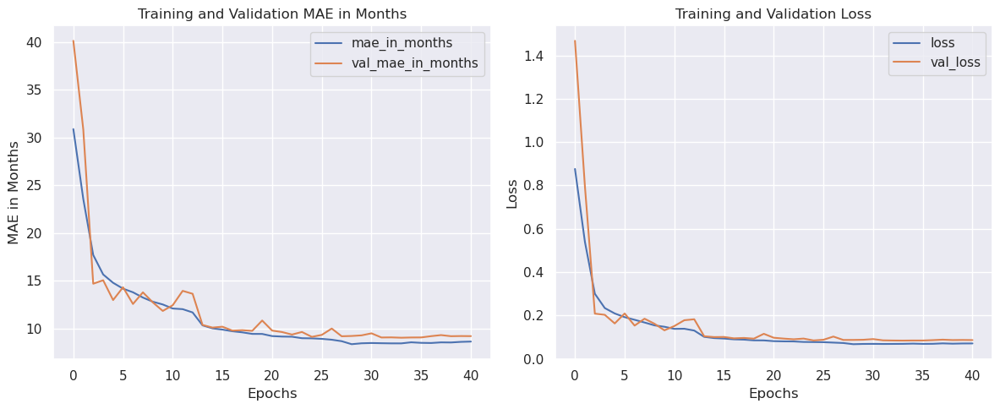

In [22]:
# Create a figure with 1 row and 2 columns (2 subplots)
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: MAE in months (Training and Validation)
metrics[['mae_in_months', 'val_mae_in_months']].plot(ax=axs[0])
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('MAE in Months')
axs[0].set_title('Training and Validation MAE in Months')

# Plot 2: Loss (Training and Validation)
metrics[['loss', 'val_loss']].plot(ax=axs[1])
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training and Validation Loss')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the combined plots
plt.show()

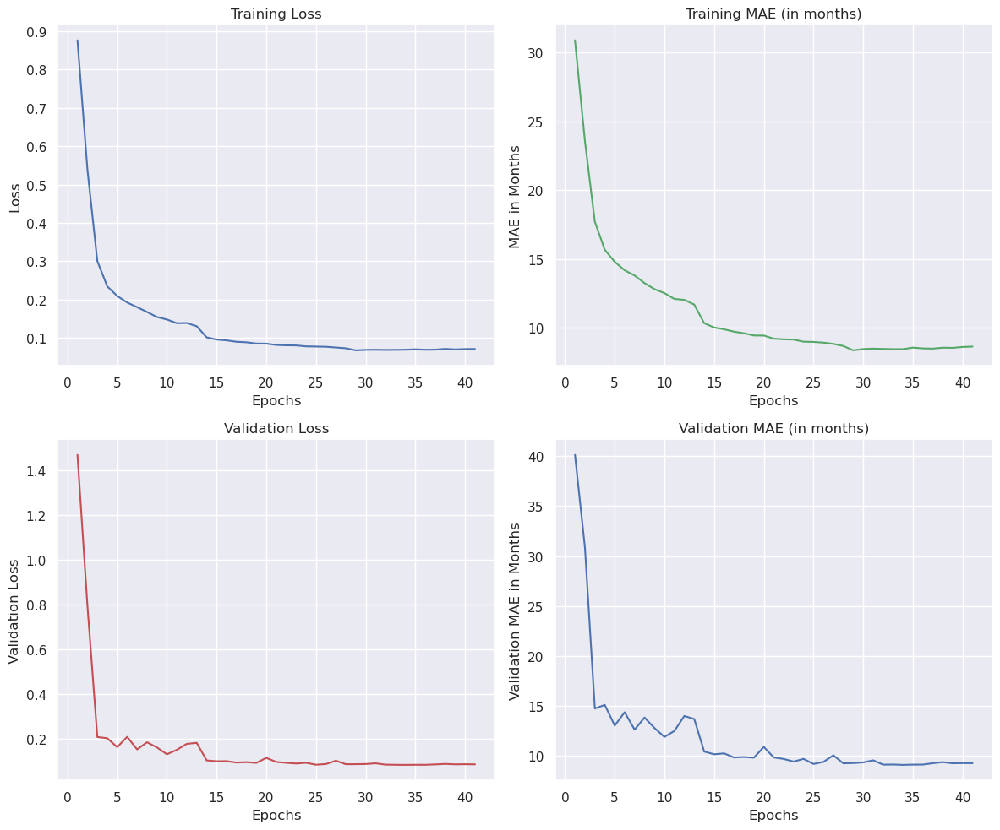

In [23]:
# Create a figure with 2 rows and 2 columns (4 subplots in total)
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Loss
axs[0, 0].plot(metrics.index + 1, metrics['loss'], label='Loss')
axs[0, 0].set_title('Training Loss')
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Loss')

# Plot 2: MAE in months
axs[0, 1].plot(metrics.index + 1, metrics['mae_in_months'], label='MAE in Months', color='g')
axs[0, 1].set_title('Training MAE (in months)')
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('MAE in Months')

# Plot 3: Validation Loss
axs[1, 0].plot(metrics.index + 1, metrics['val_loss'], label='Validation Loss', color='r')
axs[1, 0].set_title('Validation Loss')
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Validation Loss')

# Plot 4: Validation MAE in months
axs[1, 1].plot(metrics.index + 1, metrics['val_mae_in_months'], label='Validation MAE in Months', color='b')
axs[1, 1].set_title('Validation MAE (in months)')
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Validation MAE in Months')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the combined plots
plt.show()

In [29]:
try:
    test_loss, test_mae = conv_mixer_model_1.evaluate([test_X, gender_test], test_Y)
    print(f"Test Loss: {round(test_loss, 4)}")
    print(f"Test MAE: {round(test_mae, 2)} months")
except Exception as e:
    print("Error during evaluation:", str(e))

32/32 [==============================] - 20s 612ms/step - loss: 0.0842 - mae_in_months: 9.0198
Test Loss: 0.0842
Test MAE: 9.02 months


In [42]:
pred_start_time = time.time()
pred = mean_bone_age + std_bone_age*(conv_mixer_model_1.predict([test_X, gender_test], batch_size = batch_size, verbose = True))
inference_time = (time.time() - pred_start_time) / len(test_X)
print(f"Inference time per sample: {inference_time:.4f} seconds")

test_months = mean_bone_age + std_bone_age*(test_Y)

process = psutil.Process()
print(f"Memory usage: {process.memory_info().rss / 1024**2:.2f} MB " + f"or {process.memory_info().rss / (1024**2)/1000:.2f} GB")

125/125 [==============================] - 20s 157ms/step
Inference time per sample: 0.0217 seconds
Memory usage: 5783.34 MB or 5.78 GB


In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(test_months, pred)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(test_months, pred)

# Calculate R-squared (R²)
r2 = r2_score(test_months, pred)

# Print the results
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R²): {r2:.4f}")

Mean Squared Error (MSE): 142.7568
Mean Absolute Error (MAE): 9.0198
R-squared (R²): 0.9216


In [28]:
e=[]
for i in range(len(pred)):
    e.append(abs(pred[i]-test_months[i]))
    
d={"predicted":[i for i in pred],"original":[j for j in test_months],"error":e}
df=pd.DataFrame(d)

# Manual calculation of MAE

s=0
for i in range(len(e)):
    s+=e[i]
mae=s/len(e)

print(mae)
print(max(e))
print(min(e))

[9.019808]
[42.775528]
[0.02696228]


Text(0, 0.5, 'Predicted Age (Months)')

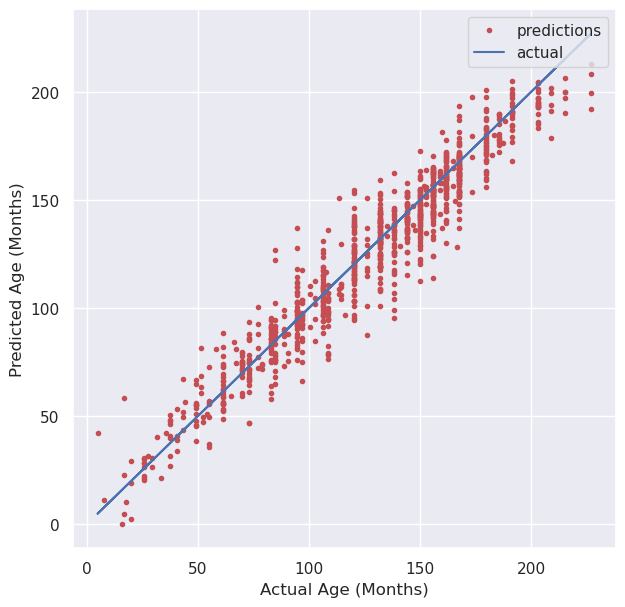

In [27]:
fig, ax = plt.subplots(figsize = (7,7))
ax.plot(test_months, pred, 'r.', label = 'predictions')
ax.plot(test_months, test_months, 'b-', label = 'actual')
ax.legend(loc = 'upper right')
ax.set_xlabel('Actual Age (Months)')
ax.set_ylabel('Predicted Age (Months)')

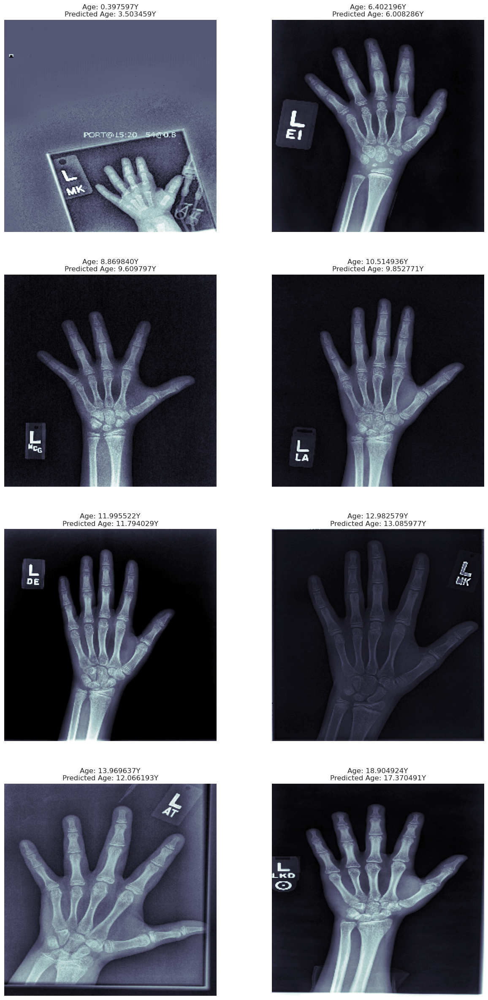

In [30]:
ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 8).astype(int)] # take 8 evenly spaced ones
fig, axs = plt.subplots(4, 2, figsize = (15, 30))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fY' % (test_months[ind]/12.0, 
                                                           pred[ind]/12.0))
    ax.axis('off')
fig.savefig(r"C:\Users\user\Downloads\trained_image_predictions.png", dpi = 300)

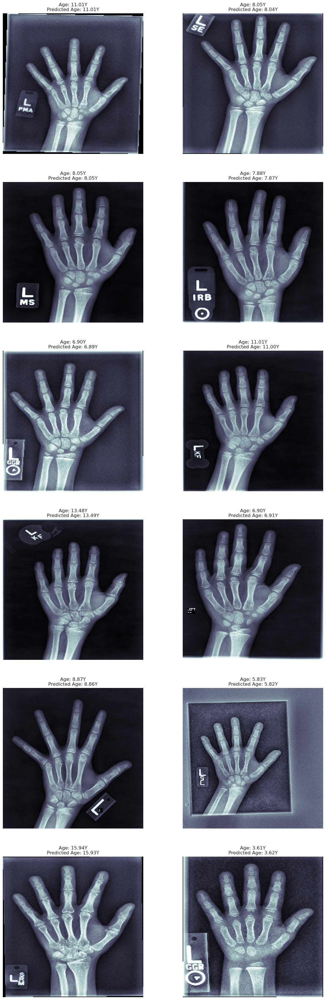

In [31]:
pred = pred.astype(np.float64)
# Sort the DataFrame by the 'error' column in ascending order
df_sorted = df.sort_values(by='error', ascending=True)

# Select the top 8 rows with the least error
least_error_samples = df_sorted.head(12)

# Get the corresponding indices from the DataFrame
least_error_indices = least_error_samples.index

# Create the figure and axes
fig, axs = plt.subplots(6, 2, figsize=(15, 45))

for ind, ax in zip(least_error_indices, axs.flatten()):
    ax.imshow(test_X[ind, :, :, 0], cmap='bone')
    pred_value = pred[ind][0]  # Access the single element (assuming one column)
    age_str = f"{test_months[ind] / 12.0:.2f}Y"
    pred_str = f"{pred_value / 12.0:.2f}Y"
    ax.set_title(f'Age: {age_str}\nPredicted Age: {pred_str}')
    ax.axis('off')

# Save the figure
fig.savefig(r"C:\Users\user\Downloads\trained_image_predictions_least_error.png", dpi=300)

## **Model 2: Xception**

In [16]:
"""
## Hyperparameters
"""

learning_rate = 1e-4
weight_decay = 1e-5
batch_size = 16
num_epochs = 50
image_size = 500  # Sample image size

In [17]:
#library required for image preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from  keras.applications.xception import preprocess_input
import cv2

"""
## Data Preparation
"""

data_augmentation = dict(rotation_range=0.2, zoom_range=0.1, horizontal_flip=True, width_shift_range=0.05, 
                         height_shift_range=0.05, shear_range=0.05, fill_mode='nearest')

train_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input, **data_augmentation)
val_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
test_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

#train_data_generator = ImageDataGenerator(preprocessing_function=preprocessor)
#val_data_generator = ImageDataGenerator(preprocessing_function=preprocessor)
#test_data_generator = ImageDataGenerator(preprocessing_function=preprocessor)

train_generator = train_data_generator.flow_from_dataframe(
    dataframe=df_train,
    directory='/kaggle/input/rsna-bone-age/boneage-training-dataset/boneage-training-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='raw',
    flip_horizontal=True,
    color_mode='rgb',
    target_size=(image_size, image_size))

val_generator = val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode='raw',
    flip_horizontal=True,
    color_mode='rgb',
    target_size=(image_size, image_size))

test_generator = test_data_generator.flow_from_dataframe(
    dataframe=df_test,
    directory='/kaggle/input/rsna-bone-age/boneage-test-dataset/boneage-test-dataset',
    x_col='id',
    y_col='gender',
    batch_size=batch_size,
    seed=42, 
    shuffle=True,
    class_mode=None,
    color_mode='rgb',
    target_size=(image_size, image_size))

Found 12611 validated image filenames.
Found 1425 validated image filenames.
Found 200 validated image filenames.


In [18]:
test_X, test_Y = next(val_data_generator.flow_from_dataframe(
    dataframe=df_valid,
    directory='/kaggle/input/rsna-boneage-val/rsna-bone-age/rsna-boneage-validation-dataset',
    x_col='id',
    y_col='bone_age_z',
    batch_size=1000,
    class_mode='raw',
    target_size=(image_size, image_size)))

Found 1425 validated image filenames.


In [19]:
xcept_m4 = Xception(weights='imagenet', include_top=False, 
                       input_shape=(image_size, image_size, 3), pooling='average')

for layer in xcept_m4.layers:
    layer.trainable = True

x = xcept_m4.output
x = GlobalAveragePooling2D()(x)
#x = Dense(1024, activation='relu')(x)
#x = Dense(512, activation='relu')(x)
#x = Flatten()(x)
#x = Dropout(0.5)(x)

gender_input = Input(shape=(1,), name='gender_input')
gender_densed = Dense(32, activation='relu')(gender_input)
x = Concatenate()([x, gender_densed])

x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)

output = Dense(1, activation='linear', name='age')(x)

xcept_model_3 = Model(inputs=[xcept_m4.input, gender_input], outputs=output)
#model6 = Model(inputs=model_3.input, outputs=output)

83683744/83683744 [==============================] - 3s 0us/step


In [20]:
#reduces learning rate if no significant decrease in loss for {{patience}} epochs.
RLROP = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae_in_months', patience=3, verbose=1, factor=0.1, min_lr=1e-6)

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_mae_in_months',
    patience=11,
    restore_best_weights=True
)

optimizer = AdamW(
    learning_rate = learning_rate, 
    weight_decay = weight_decay
)

xcept_model_3.compile(optimizer=optimizer, 
                loss='mse', 
                metrics=[mae_in_months])

checkpoint_filepath = "/tmp/checkpoint.keras"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor='mae_in_months',
        save_best_only=True,
        save_weights_only=False,
)

xcept_model_3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 500, 500, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 249, 249, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 249, 249, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                             

**Visualize Model**

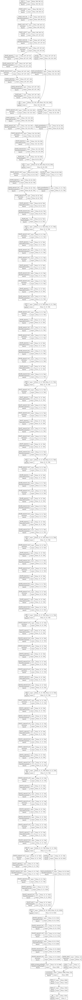

In [21]:
plot_model(
    xcept_model_3,
    to_file='convmixer_model_structure.png',  # Save as a .png file
    show_shapes=True,               # Display output shapes for each layer
    show_dtype=True,                # Display data types of tensors
    show_layer_names=True,          # Display layer names
    expand_nested=False,             # Expand nested models
    dpi=96                          # Set the resolution
)

/opt/conda/lib/python3.7/site-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


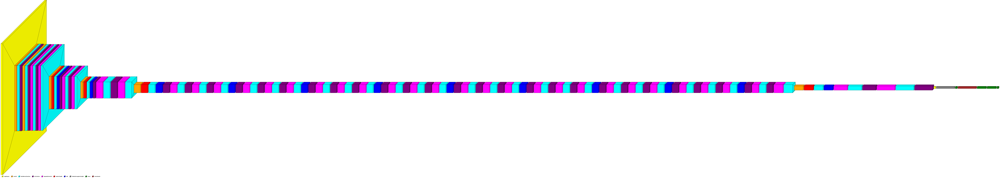

In [22]:
color_map = defaultdict(dict)

color_map[InputLayer]['fill'] = 'yellow'
color_map[SeparableConv2D]['fill'] = 'magenta'
color_map[Conv2D]['fill'] = 'orange'
color_map[Activation]['fill'] = 'purple'
color_map[BatchNormalization]['fill'] = 'cyan'
color_map[MaxPool2D]['fill'] = 'red'
color_map[Add]['fill'] = 'blue'
color_map[GlobalAveragePooling2D]['fill'] = 'gray'
color_map[Dense]['fill'] = 'green'
color_map[Concatenate]['fill'] = 'brown'

visualkeras.layered_view(xcept_model_3, draw_volume=True, legend=True, color_map=color_map, scale_xy=3)

In [23]:
train_steps = len(df_train) // batch_size
val_steps = len(df_valid) // batch_size

start_time = time.time()

history_xcept_3 = xcept_model_3.fit(
    custom_generator(train_generator, df_train, batch_size),
    steps_per_epoch=train_steps,
    epochs=num_epochs,
    validation_data=custom_generator(val_generator, df_valid, batch_size),
    validation_steps=val_steps,
    verbose=1, 
    callbacks=[checkpoint_callback, RLROP, early_stop]
)

end_time = time.time()
training_time = end_time - start_time

Epoch 1/50
788/788 [==============================] - 1337s 2s/step - loss: 0.1840 - mae_in_months: 13.6842 - val_loss: 0.1896 - val_mae_in_months: 14.8124 - lr: 1.0000e-04
Epoch 2/50
788/788 [==============================] - 1163s 1s/step - loss: 0.1117 - mae_in_months: 10.9248 - val_loss: 0.1031 - val_mae_in_months: 10.3753 - lr: 1.0000e-04
Epoch 3/50
788/788 [==============================] - 1165s 1s/step - loss: 0.0949 - mae_in_months: 10.0291 - val_loss: 0.0920 - val_mae_in_months: 9.6687 - lr: 1.0000e-04
Epoch 4/50
788/788 [==============================] - 1156s 1s/step - loss: 0.0823 - mae_in_months: 9.3399 - val_loss: 0.1190 - val_mae_in_months: 11.2141 - lr: 1.0000e-04
Epoch 5/50
788/788 [==============================] - 1179s 1s/step - loss: 0.0732 - mae_in_months: 8.7343 - val_loss: 0.1403 - val_mae_in_months: 12.1345 - lr: 1.0000e-04
Epoch 6/50
788/788 [==============================] - 1152s 1s/step - loss: 0.0679 - mae_in_months: 8.4321 - val_loss: 0.0755 - val_mae_in

In [ ]:
metrics = pd.DataFrame(history_xcept_3.history)
print(f"Training time: {training_time:.2f} seconds / {training_time/60:.2f} minutes.")

Training time: 30905.38 seconds / 515.09 minutes.

<AxesSubplot:>

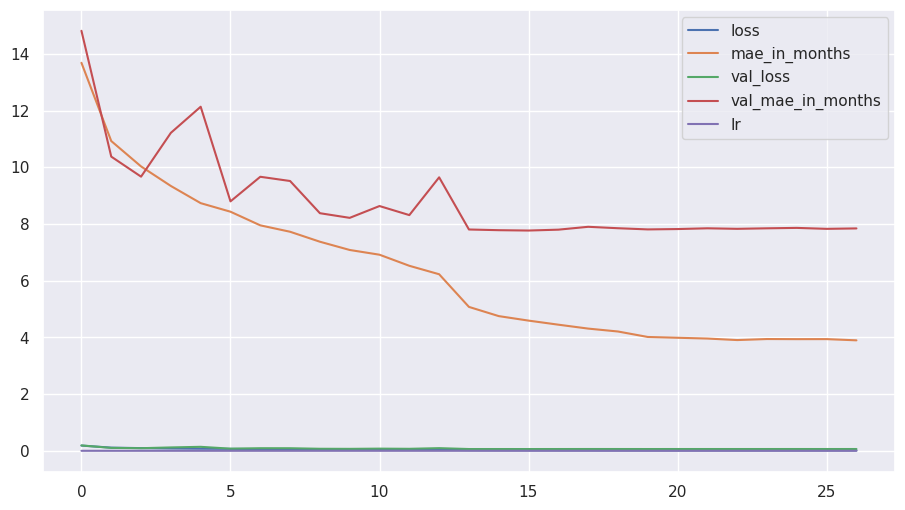

In [27]:
metrics.plot()

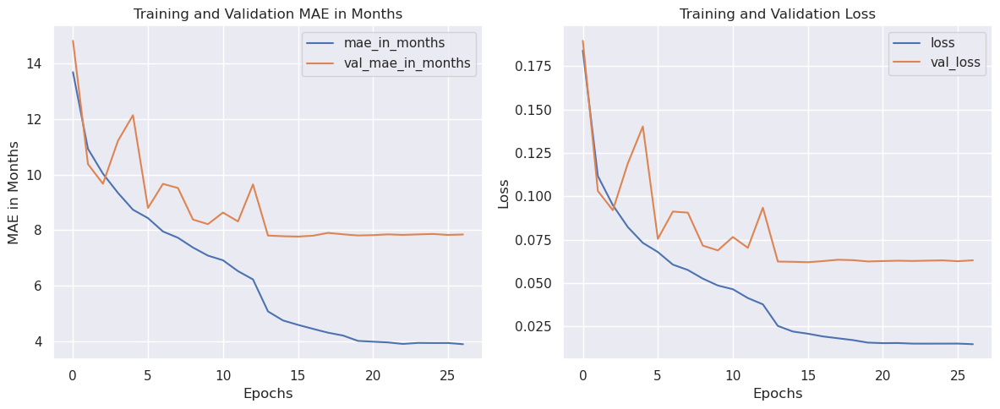

In [28]:
# Create a figure with 1 row and 2 columns (2 subplots)
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: MAE in months (Training and Validation)
metrics[['mae_in_months', 'val_mae_in_months']].plot(ax=axs[0])
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('MAE in Months')
axs[0].set_title('Training and Validation MAE in Months')

# Plot 2: Loss (Training and Validation)
metrics[['loss', 'val_loss']].plot(ax=axs[1])
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training and Validation Loss')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the combined plots
plt.show()

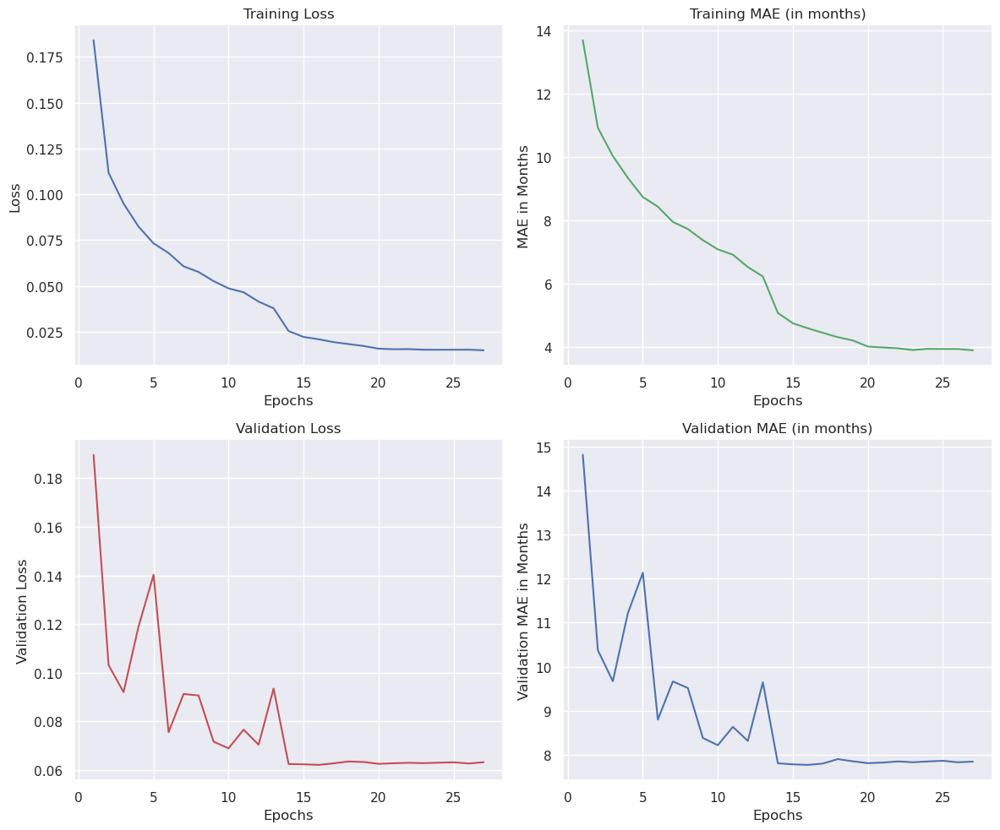

In [29]:
# Create a figure with 2 rows and 2 columns (4 subplots in total)
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Loss
axs[0, 0].plot(metrics.index + 1, metrics['loss'], label='Loss')
axs[0, 0].set_title('Training Loss')
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Loss')

# Plot 2: MAE in months
axs[0, 1].plot(metrics.index + 1, metrics['mae_in_months'], label='MAE in Months', color='g')
axs[0, 1].set_title('Training MAE (in months)')
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('MAE in Months')

# Plot 3: Validation Loss
axs[1, 0].plot(metrics.index + 1, metrics['val_loss'], label='Validation Loss', color='r')
axs[1, 0].set_title('Validation Loss')
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Validation Loss')

# Plot 4: Validation MAE in months
axs[1, 1].plot(metrics.index + 1, metrics['val_mae_in_months'], label='Validation MAE in Months', color='b')
axs[1, 1].set_title('Validation MAE (in months)')
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Validation MAE in Months')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the combined plots
plt.show()

In [26]:
pred_start_time = time.time()
pred = mean_bone_age + std_bone_age*(xcept_model_3.predict([test_X, gender_test], batch_size = batch_size, verbose = True))
inference_time = (time.time() - pred_start_time) / len(test_X)
print(f"Inference time per sample: {inference_time:.4f} seconds")

test_months = mean_bone_age + std_bone_age * (test_Y)

process = psutil.Process()
print(f"Memory usage: {process.memory_info().rss / 1024**2:.2f} MB " + f"or {process.memory_info().rss / (1024**2)/1000:.2f} GB")

63/63 [==============================] - 12s 185ms/step
Inference time per sample: 0.0183 seconds
Memory usage: 9762.70 MB or 9.76 GB


In [46]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

test_loss, test_mae = xcept_model_1.evaluate([test_X, gender_test], test_Y)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(test_months, pred)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(test_months, pred)

# Calculate R-squared (R²)
r2 = r2_score(test_months, pred)

# Print the results
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R²): {r2:.4f}")

32/32 [==============================] - 11s 342ms/step - loss: 0.0606 - mae_in_months: 7.7455
Mean Squared Error (MSE): 100.3813
Mean Absolute Error (MAE): 7.6390
R-squared (R²): 0.9411


In [44]:
#Manual calculation of MAE

e=[]
for i in range(len(pred)):
    e.append(abs(pred[i]-test_months[i]))
    
d={"predicted":[i for i in pred],"original":[j for j in test_months],"error":e}
df=pd.DataFrame(d)

s=0
for i in range(len(e)):
    s+=e[i]
mae=s/len(e)
print(mae)
print(max(e))
print(min(e))

[7.63897102]
[41.99463525]
[0.00291392]


Text(0, 0.5, 'Predicted Age (Months)')

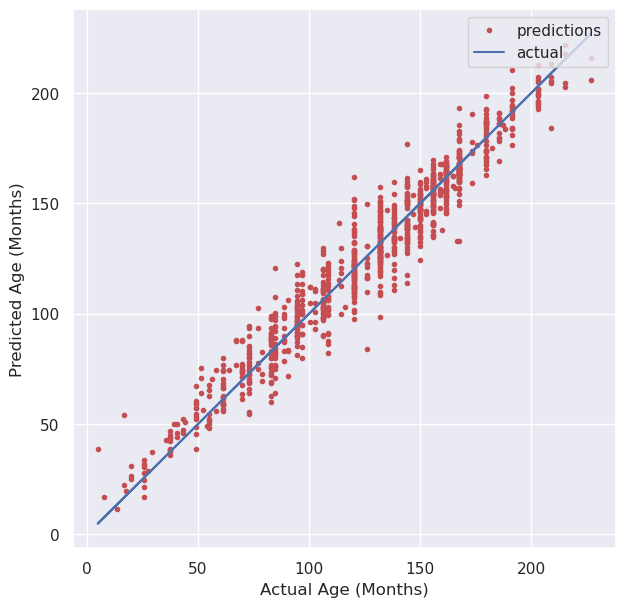

In [27]:
fig, ax = plt.subplots(figsize = (7,7))
ax.plot(test_months, pred, 'r.', label = 'predictions')
ax.plot(test_months, test_months, 'b-', label = 'actual')
ax.legend(loc = 'upper right')
ax.set_xlabel('Actual Age (Months)')
ax.set_ylabel('Predicted Age (Months)')

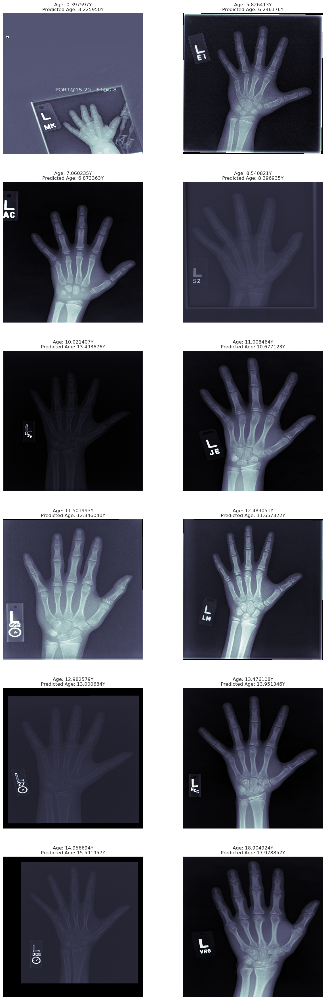

In [39]:
ord_ind = np.argsort(test_Y)
ord_ind = ord_ind[np.linspace(0, len(ord_ind)-1, 12).astype(int)] # take 12 evenly spaced ones
fig, axs = plt.subplots(6, 2, figsize = (15, 45))
for (ind, ax) in zip(ord_ind, axs.flatten()):
    ax.imshow(test_X[ind, :,:,0], cmap = 'bone')
    ax.set_title('Age: %fY\nPredicted Age: %fY' % (test_months[ind]/12.0, 
                                                           pred[ind]/12.0))
    ax.axis('off')
fig.savefig('/kaggle/working/trained_image_predictions.png', dpi = 300)

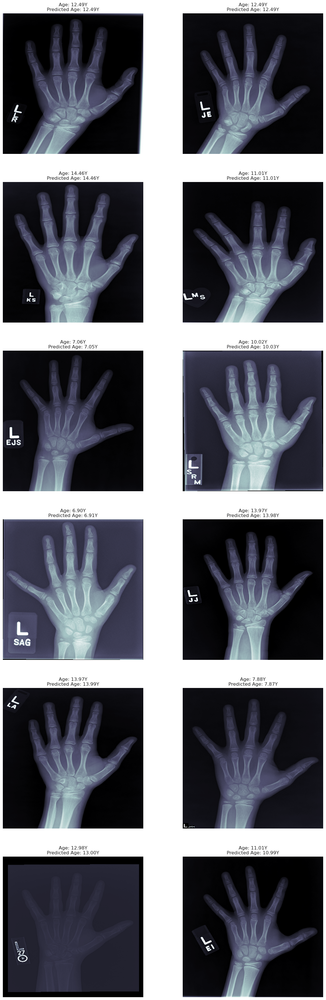

In [41]:
pred = pred.astype(np.float64)
# Sort the DataFrame by the 'error' column in ascending order
df_sorted = df.sort_values(by='error', ascending=True)

# Select the top 8 rows with the least error
least_error_samples = df_sorted.head(12)

# Get the corresponding indices from the DataFrame
least_error_indices = least_error_samples.index

# Create the figure and axes
fig, axs = plt.subplots(6, 2, figsize=(15, 45))

for ind, ax in zip(least_error_indices, axs.flatten()):
    ax.imshow(test_X[ind, :, :, 0], cmap='bone')
    pred_value = pred[ind][0]  # Access the single element (assuming one column)
    age_str = f"{test_months[ind] / 12.0:.2f}Y"
    pred_str = f"{pred_value / 12.0:.2f}Y"
    ax.set_title(f'Age: {age_str}\nPredicted Age: {pred_str}')
    ax.axis('off')

# Save the figure
fig.savefig(r"C:\Users\user\Downloads\trained_image_predictions_least_error.png", dpi=300)